# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

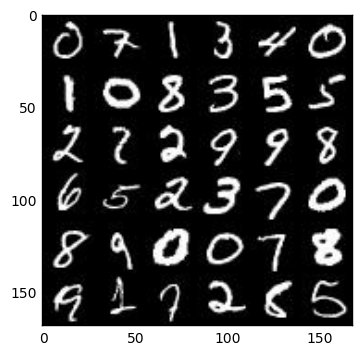

In [2]:
show_n_images = 42

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

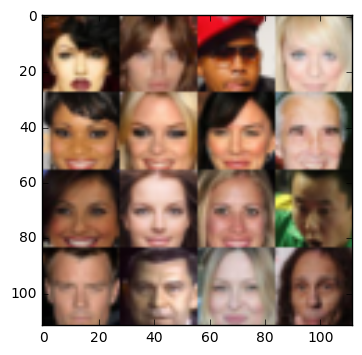

In [3]:
show_n_images = 16

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height,
                                              image_channels), name='real_inputs')
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name='z_inputs')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(0.2 * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(0.2 * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(0.2 * bn3, bn3)
        
        flatten = tf.reshape(relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flatten, 1)
        output = tf.sigmoid(logits)

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse = not(is_train)):
        
        x1 = tf.layers.dense(z, 7*7*512)
        
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * bn1, bn1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * bn2, bn2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2 * bn3, bn3)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=1, padding='same')
        output = tf.tanh(logits)
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = d_logits_real,
            labels = tf.ones_like(d_model_real)
        )
    )
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = d_logits_fake,
            labels = tf.zeros_like(d_model_fake)
        )
    )
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = d_logits_fake,
            labels = tf.ones_like(d_model_fake)
        )
    )
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    train_vars = tf.trainable_variables()
    g_vars = [v for v in train_vars if v.name.startswith('generator')]
    d_vars = [v for v in train_vars if v.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')):        
        g_train_opt = tf.train.AdamOptimizer(
            learning_rate = learning_rate,
            beta1 = beta1
        ).minimize(g_loss, var_list = g_vars)
    
    d_train_opt = tf.train.AdamOptimizer(
        learning_rate = learning_rate,
        beta1 = beta1
    ).minimize(d_loss, var_list = d_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    counter = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                counter += 1
                batch_images = batch_images * 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learn_rate: learning_rate})
                sess.run(g_opt, feed_dict={input_z: batch_z, learn_rate: learning_rate})
                
                if counter % 20 == 0:
                    # Get printout after every other epoch
                    g_training_loss = g_loss.eval({input_z: batch_z})
                    d_training_loss = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    
                    print(
                        "Epoch {}/{}...".format(epoch_i+1, epoch_count),
                        "Generator Loss: {:.4f}".format(g_training_loss),
                        "Discriminator Loss: {:.4f}...".format(d_training_loss)
                    )
                    
                if counter % 100 == 0:
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)
    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Generator Loss: 7.7118 Discriminator Loss: 0.0018...
Epoch 1/2... Generator Loss: 9.0486 Discriminator Loss: 0.0028...
Epoch 1/2... Generator Loss: 6.5936 Discriminator Loss: 0.0412...
Epoch 1/2... Generator Loss: 3.0120 Discriminator Loss: 0.4075...
Epoch 1/2... Generator Loss: 2.3747 Discriminator Loss: 0.3069...


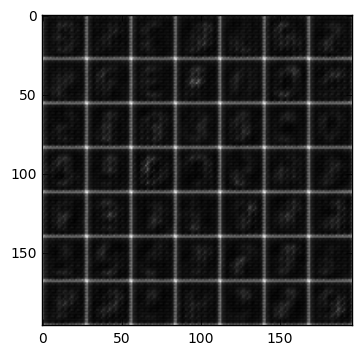

Epoch 1/2... Generator Loss: 0.1714 Discriminator Loss: 2.3655...
Epoch 1/2... Generator Loss: 1.0371 Discriminator Loss: 0.8920...
Epoch 1/2... Generator Loss: 0.6366 Discriminator Loss: 1.5578...
Epoch 1/2... Generator Loss: 3.3557 Discriminator Loss: 1.2311...
Epoch 1/2... Generator Loss: 0.6812 Discriminator Loss: 1.0798...


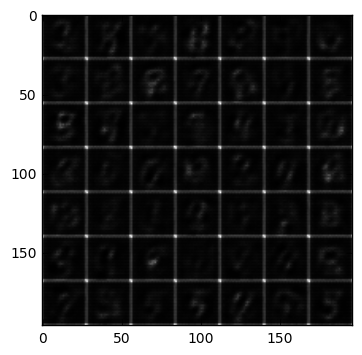

Epoch 1/2... Generator Loss: 1.3667 Discriminator Loss: 0.8765...
Epoch 1/2... Generator Loss: 1.4440 Discriminator Loss: 0.9792...
Epoch 1/2... Generator Loss: 1.8190 Discriminator Loss: 0.9916...
Epoch 1/2... Generator Loss: 1.3497 Discriminator Loss: 0.7968...
Epoch 1/2... Generator Loss: 0.7213 Discriminator Loss: 0.9376...


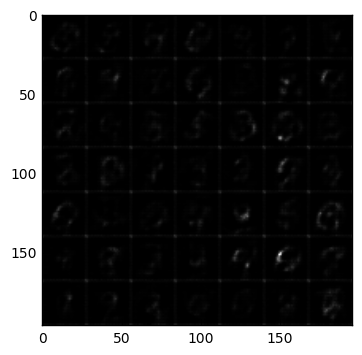

Epoch 1/2... Generator Loss: 1.2558 Discriminator Loss: 0.6678...
Epoch 1/2... Generator Loss: 0.6162 Discriminator Loss: 1.0518...
Epoch 1/2... Generator Loss: 0.6269 Discriminator Loss: 1.0527...
Epoch 1/2... Generator Loss: 2.0032 Discriminator Loss: 0.8448...
Epoch 1/2... Generator Loss: 0.6507 Discriminator Loss: 1.0594...


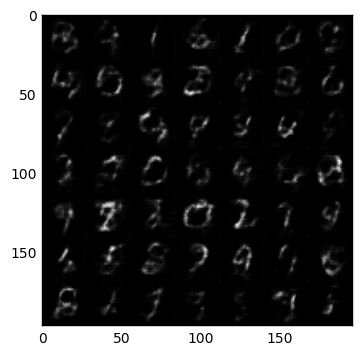

Epoch 1/2... Generator Loss: 0.7876 Discriminator Loss: 0.9816...
Epoch 1/2... Generator Loss: 0.6335 Discriminator Loss: 1.0774...
Epoch 1/2... Generator Loss: 0.5924 Discriminator Loss: 1.0842...
Epoch 1/2... Generator Loss: 0.8203 Discriminator Loss: 0.8566...
Epoch 1/2... Generator Loss: 2.6716 Discriminator Loss: 1.5636...


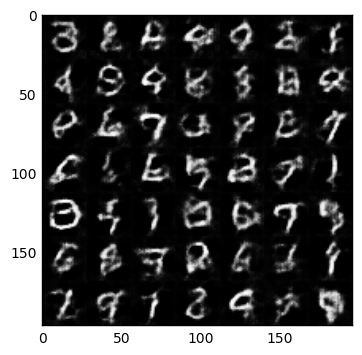

Epoch 1/2... Generator Loss: 0.9849 Discriminator Loss: 0.8420...
Epoch 1/2... Generator Loss: 1.4099 Discriminator Loss: 0.8587...
Epoch 1/2... Generator Loss: 1.3134 Discriminator Loss: 0.8140...
Epoch 1/2... Generator Loss: 1.0648 Discriminator Loss: 0.8923...
Epoch 1/2... Generator Loss: 1.0507 Discriminator Loss: 0.7778...


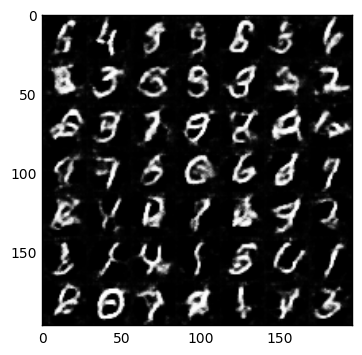

Epoch 1/2... Generator Loss: 0.4983 Discriminator Loss: 1.1878...
Epoch 1/2... Generator Loss: 1.4050 Discriminator Loss: 0.9100...
Epoch 1/2... Generator Loss: 1.6886 Discriminator Loss: 0.7873...
Epoch 1/2... Generator Loss: 0.4572 Discriminator Loss: 1.2782...
Epoch 1/2... Generator Loss: 1.1425 Discriminator Loss: 0.7996...


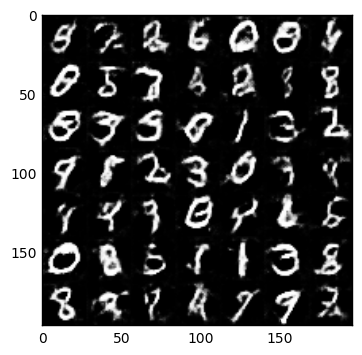

Epoch 1/2... Generator Loss: 0.9181 Discriminator Loss: 0.8250...
Epoch 1/2... Generator Loss: 1.6332 Discriminator Loss: 0.8024...
Epoch 1/2... Generator Loss: 0.3521 Discriminator Loss: 1.4591...
Epoch 1/2... Generator Loss: 1.7269 Discriminator Loss: 0.8325...
Epoch 1/2... Generator Loss: 0.9564 Discriminator Loss: 0.7585...


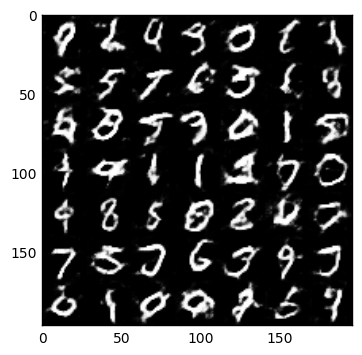

Epoch 1/2... Generator Loss: 2.2522 Discriminator Loss: 0.9208...
Epoch 1/2... Generator Loss: 0.8510 Discriminator Loss: 0.9017...
Epoch 1/2... Generator Loss: 3.5571 Discriminator Loss: 1.9082...
Epoch 1/2... Generator Loss: 1.0921 Discriminator Loss: 0.7417...
Epoch 1/2... Generator Loss: 1.5902 Discriminator Loss: 0.6180...


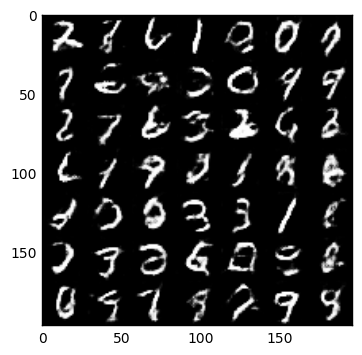

Epoch 1/2... Generator Loss: 1.7122 Discriminator Loss: 1.2137...
Epoch 2/2... Generator Loss: 0.9873 Discriminator Loss: 0.7540...
Epoch 2/2... Generator Loss: 0.5011 Discriminator Loss: 1.2195...
Epoch 2/2... Generator Loss: 4.3413 Discriminator Loss: 2.6772...
Epoch 2/2... Generator Loss: 0.6945 Discriminator Loss: 0.9032...


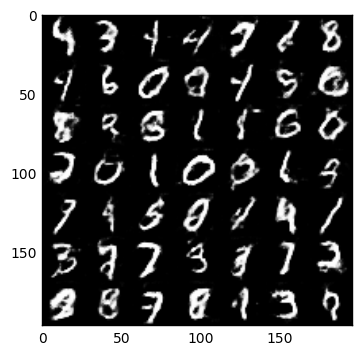

Epoch 2/2... Generator Loss: 0.8707 Discriminator Loss: 0.7418...
Epoch 2/2... Generator Loss: 1.1389 Discriminator Loss: 0.6940...
Epoch 2/2... Generator Loss: 0.8313 Discriminator Loss: 1.0809...
Epoch 2/2... Generator Loss: 0.4052 Discriminator Loss: 1.3724...
Epoch 2/2... Generator Loss: 0.6131 Discriminator Loss: 0.9951...


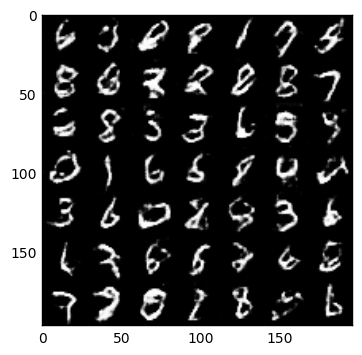

Epoch 2/2... Generator Loss: 0.9082 Discriminator Loss: 0.8480...
Epoch 2/2... Generator Loss: 0.5965 Discriminator Loss: 1.0383...
Epoch 2/2... Generator Loss: 1.0388 Discriminator Loss: 0.8592...
Epoch 2/2... Generator Loss: 0.5982 Discriminator Loss: 1.0586...
Epoch 2/2... Generator Loss: 0.9368 Discriminator Loss: 0.8450...


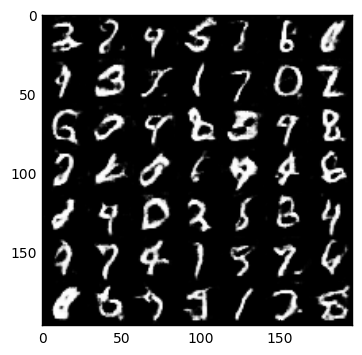

Epoch 2/2... Generator Loss: 0.6946 Discriminator Loss: 0.9407...
Epoch 2/2... Generator Loss: 0.7834 Discriminator Loss: 0.9396...
Epoch 2/2... Generator Loss: 0.4112 Discriminator Loss: 1.4421...
Epoch 2/2... Generator Loss: 2.1334 Discriminator Loss: 0.8662...
Epoch 2/2... Generator Loss: 0.7659 Discriminator Loss: 0.8937...


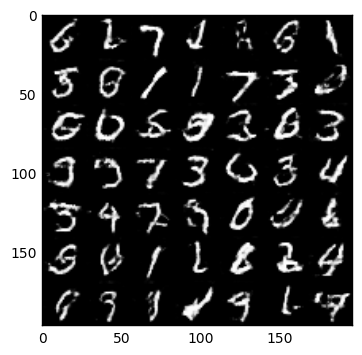

Epoch 2/2... Generator Loss: 1.2199 Discriminator Loss: 0.6486...
Epoch 2/2... Generator Loss: 1.1409 Discriminator Loss: 0.7295...
Epoch 2/2... Generator Loss: 0.6227 Discriminator Loss: 1.0346...
Epoch 2/2... Generator Loss: 0.6183 Discriminator Loss: 1.0307...
Epoch 2/2... Generator Loss: 2.4585 Discriminator Loss: 0.6952...


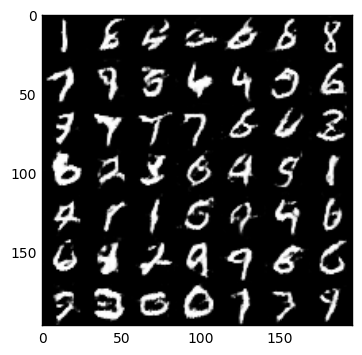

Epoch 2/2... Generator Loss: 0.5043 Discriminator Loss: 1.2157...
Epoch 2/2... Generator Loss: 1.7682 Discriminator Loss: 0.9045...
Epoch 2/2... Generator Loss: 0.8453 Discriminator Loss: 0.7688...
Epoch 2/2... Generator Loss: 0.6578 Discriminator Loss: 1.0830...
Epoch 2/2... Generator Loss: 0.6238 Discriminator Loss: 1.1388...


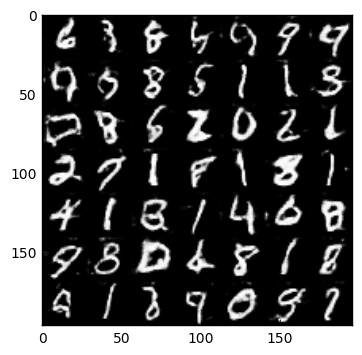

Epoch 2/2... Generator Loss: 1.0125 Discriminator Loss: 0.7557...
Epoch 2/2... Generator Loss: 2.6169 Discriminator Loss: 1.1684...
Epoch 2/2... Generator Loss: 1.2147 Discriminator Loss: 0.7494...
Epoch 2/2... Generator Loss: 1.4437 Discriminator Loss: 0.5381...
Epoch 2/2... Generator Loss: 1.3506 Discriminator Loss: 0.8688...


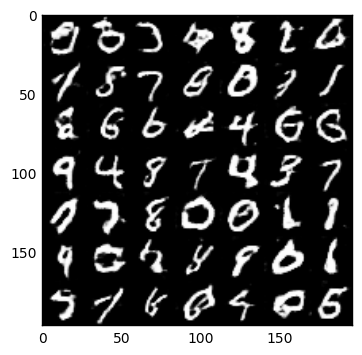

Epoch 2/2... Generator Loss: 1.0190 Discriminator Loss: 0.8381...
Epoch 2/2... Generator Loss: 2.1122 Discriminator Loss: 0.6506...
Epoch 2/2... Generator Loss: 1.4536 Discriminator Loss: 0.7422...
Epoch 2/2... Generator Loss: 2.0218 Discriminator Loss: 0.6618...
Epoch 2/2... Generator Loss: 0.6453 Discriminator Loss: 1.0334...


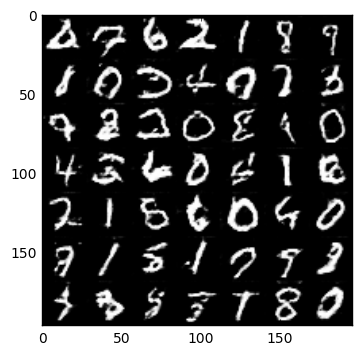

Epoch 2/2... Generator Loss: 0.7253 Discriminator Loss: 0.9404...
Epoch 2/2... Generator Loss: 1.5502 Discriminator Loss: 0.7855...
Epoch 2/2... Generator Loss: 0.8090 Discriminator Loss: 0.8295...
Epoch 2/2... Generator Loss: 0.3489 Discriminator Loss: 1.5502...
Epoch 2/2... Generator Loss: 1.0215 Discriminator Loss: 0.7333...


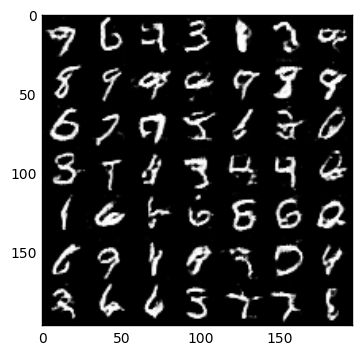

Epoch 2/2... Generator Loss: 0.7502 Discriminator Loss: 0.9278...
Epoch 2/2... Generator Loss: 1.5449 Discriminator Loss: 0.7692...
Epoch 2/2... Generator Loss: 2.5415 Discriminator Loss: 0.4047...


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Generator Loss: 8.0279 Discriminator Loss: 0.0029...
Epoch 1/1... Generator Loss: 35.9979 Discriminator Loss: 0.4081...
Epoch 1/1... Generator Loss: 16.8046 Discriminator Loss: 0.0975...
Epoch 1/1... Generator Loss: 1.5102 Discriminator Loss: 0.8889...
Epoch 1/1... Generator Loss: 1.9005 Discriminator Loss: 0.4240...


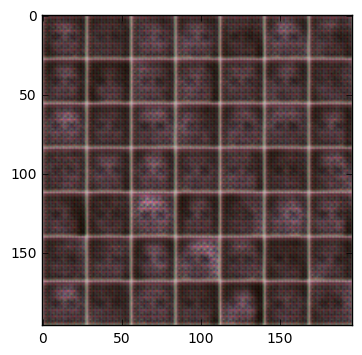

Epoch 1/1... Generator Loss: 0.2416 Discriminator Loss: 1.9966...
Epoch 1/1... Generator Loss: 4.2277 Discriminator Loss: 0.9810...
Epoch 1/1... Generator Loss: 1.5005 Discriminator Loss: 0.4592...
Epoch 1/1... Generator Loss: 3.4981 Discriminator Loss: 1.0095...
Epoch 1/1... Generator Loss: 4.1500 Discriminator Loss: 0.3562...


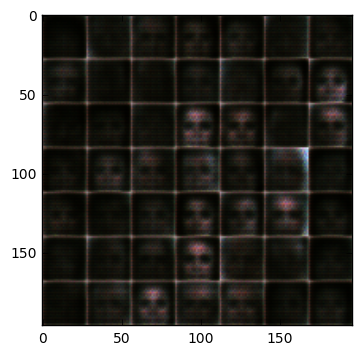

Epoch 1/1... Generator Loss: 5.3356 Discriminator Loss: 0.5040...
Epoch 1/1... Generator Loss: 3.3147 Discriminator Loss: 1.7734...
Epoch 1/1... Generator Loss: 5.6233 Discriminator Loss: 0.3006...
Epoch 1/1... Generator Loss: 8.0278 Discriminator Loss: 0.7389...
Epoch 1/1... Generator Loss: 4.4177 Discriminator Loss: 0.2095...


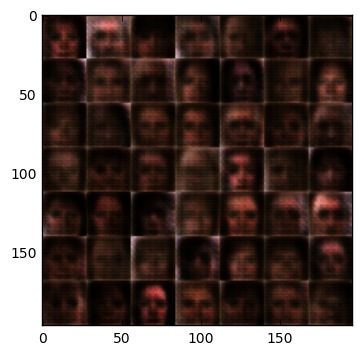

Epoch 1/1... Generator Loss: 9.2870 Discriminator Loss: 0.7792...
Epoch 1/1... Generator Loss: 4.5618 Discriminator Loss: 0.0514...
Epoch 1/1... Generator Loss: 5.7929 Discriminator Loss: 0.7535...
Epoch 1/1... Generator Loss: 6.5317 Discriminator Loss: 0.0620...
Epoch 1/1... Generator Loss: 2.4055 Discriminator Loss: 0.3458...


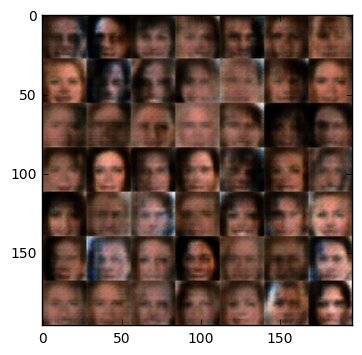

Epoch 1/1... Generator Loss: 2.5656 Discriminator Loss: 0.2010...
Epoch 1/1... Generator Loss: 4.9505 Discriminator Loss: 0.0783...
Epoch 1/1... Generator Loss: 1.2287 Discriminator Loss: 0.5302...
Epoch 1/1... Generator Loss: 2.9208 Discriminator Loss: 0.4732...
Epoch 1/1... Generator Loss: 5.7487 Discriminator Loss: 1.2031...


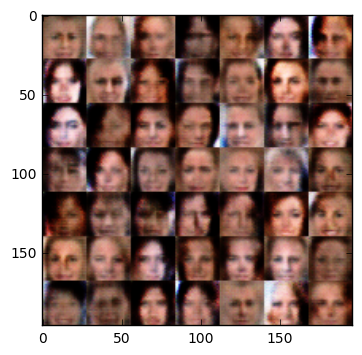

Epoch 1/1... Generator Loss: 2.1182 Discriminator Loss: 0.4922...
Epoch 1/1... Generator Loss: 2.2992 Discriminator Loss: 0.1739...
Epoch 1/1... Generator Loss: 1.2640 Discriminator Loss: 0.4966...
Epoch 1/1... Generator Loss: 0.4085 Discriminator Loss: 1.3666...
Epoch 1/1... Generator Loss: 1.8680 Discriminator Loss: 0.3820...


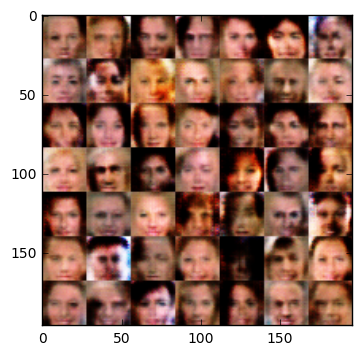

Epoch 1/1... Generator Loss: 1.2718 Discriminator Loss: 0.5096...
Epoch 1/1... Generator Loss: 0.8116 Discriminator Loss: 0.7649...
Epoch 1/1... Generator Loss: 3.5235 Discriminator Loss: 0.1942...
Epoch 1/1... Generator Loss: 2.0619 Discriminator Loss: 0.2359...
Epoch 1/1... Generator Loss: 3.5620 Discriminator Loss: 0.1611...


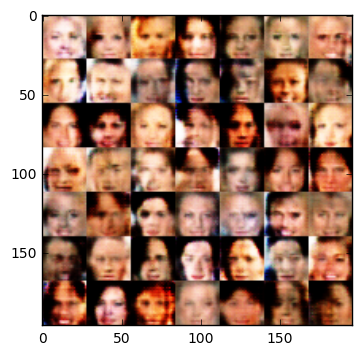

Epoch 1/1... Generator Loss: 2.8159 Discriminator Loss: 0.1359...
Epoch 1/1... Generator Loss: 5.5347 Discriminator Loss: 0.0763...
Epoch 1/1... Generator Loss: 0.0443 Discriminator Loss: 3.4873...
Epoch 1/1... Generator Loss: 0.6424 Discriminator Loss: 0.9596...
Epoch 1/1... Generator Loss: 2.6044 Discriminator Loss: 0.2178...


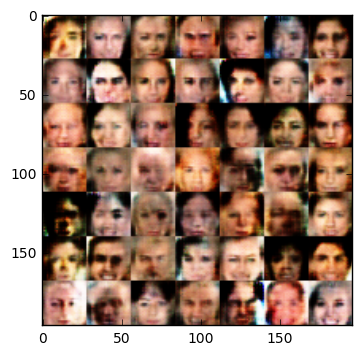

Epoch 1/1... Generator Loss: 4.2904 Discriminator Loss: 0.1002...
Epoch 1/1... Generator Loss: 4.5460 Discriminator Loss: 0.0442...
Epoch 1/1... Generator Loss: 3.6329 Discriminator Loss: 0.0942...
Epoch 1/1... Generator Loss: 7.8287 Discriminator Loss: 0.6989...
Epoch 1/1... Generator Loss: 5.1942 Discriminator Loss: 0.2276...


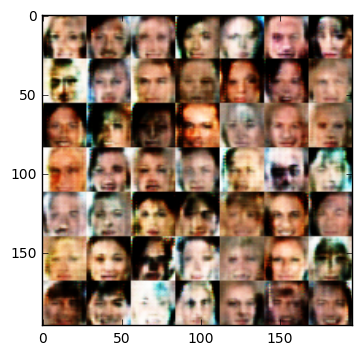

Epoch 1/1... Generator Loss: 1.0934 Discriminator Loss: 0.6496...
Epoch 1/1... Generator Loss: 3.7453 Discriminator Loss: 0.1874...
Epoch 1/1... Generator Loss: 2.5556 Discriminator Loss: 0.2073...
Epoch 1/1... Generator Loss: 3.8956 Discriminator Loss: 0.2370...
Epoch 1/1... Generator Loss: 3.7247 Discriminator Loss: 0.0778...


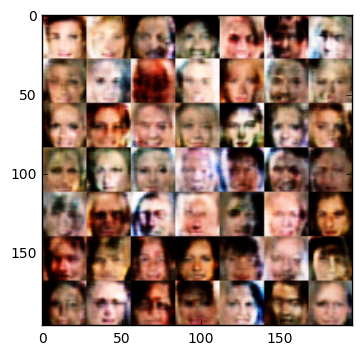

Epoch 1/1... Generator Loss: 3.9114 Discriminator Loss: 0.1540...
Epoch 1/1... Generator Loss: 3.8462 Discriminator Loss: 0.0825...
Epoch 1/1... Generator Loss: 4.1147 Discriminator Loss: 0.0975...
Epoch 1/1... Generator Loss: 2.7984 Discriminator Loss: 0.1290...
Epoch 1/1... Generator Loss: 9.6064 Discriminator Loss: 6.7108...


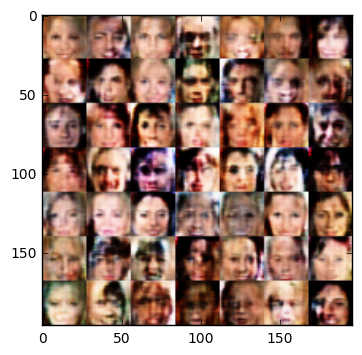

Epoch 1/1... Generator Loss: 0.8911 Discriminator Loss: 0.9130...
Epoch 1/1... Generator Loss: 2.5079 Discriminator Loss: 1.0689...
Epoch 1/1... Generator Loss: 1.2972 Discriminator Loss: 0.7700...
Epoch 1/1... Generator Loss: 0.8969 Discriminator Loss: 0.8111...
Epoch 1/1... Generator Loss: 3.4108 Discriminator Loss: 1.4253...


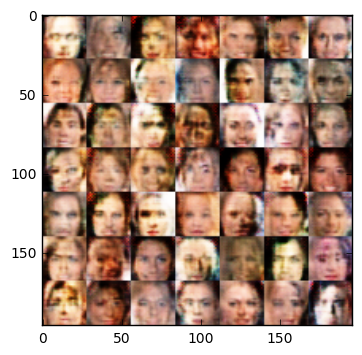

Epoch 1/1... Generator Loss: 1.4911 Discriminator Loss: 0.5384...
Epoch 1/1... Generator Loss: 0.7515 Discriminator Loss: 0.9265...
Epoch 1/1... Generator Loss: 3.2904 Discriminator Loss: 0.3261...
Epoch 1/1... Generator Loss: 4.0152 Discriminator Loss: 0.1417...
Epoch 1/1... Generator Loss: 1.6537 Discriminator Loss: 0.2997...


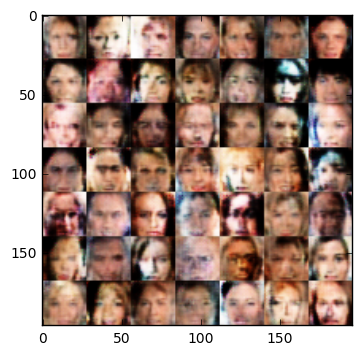

Epoch 1/1... Generator Loss: 1.8080 Discriminator Loss: 0.6106...
Epoch 1/1... Generator Loss: 1.1841 Discriminator Loss: 0.6782...
Epoch 1/1... Generator Loss: 1.6483 Discriminator Loss: 0.4455...
Epoch 1/1... Generator Loss: 4.0250 Discriminator Loss: 0.1001...
Epoch 1/1... Generator Loss: 2.7399 Discriminator Loss: 0.1701...


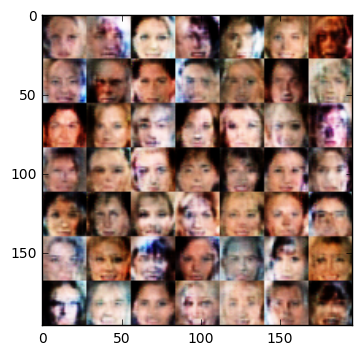

Epoch 1/1... Generator Loss: 1.8633 Discriminator Loss: 0.3195...
Epoch 1/1... Generator Loss: 4.6353 Discriminator Loss: 0.2341...
Epoch 1/1... Generator Loss: 2.8956 Discriminator Loss: 0.1553...
Epoch 1/1... Generator Loss: 0.5815 Discriminator Loss: 1.2769...
Epoch 1/1... Generator Loss: 2.1160 Discriminator Loss: 0.3249...


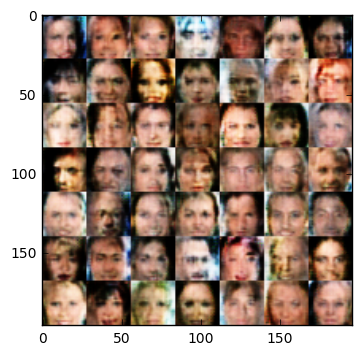

Epoch 1/1... Generator Loss: 5.9940 Discriminator Loss: 0.0802...
Epoch 1/1... Generator Loss: 5.9445 Discriminator Loss: 0.0398...
Epoch 1/1... Generator Loss: 3.5763 Discriminator Loss: 0.0715...
Epoch 1/1... Generator Loss: 1.6009 Discriminator Loss: 0.7151...
Epoch 1/1... Generator Loss: 1.7928 Discriminator Loss: 0.3585...


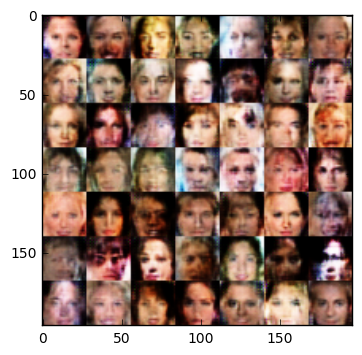

Epoch 1/1... Generator Loss: 2.7243 Discriminator Loss: 0.1608...
Epoch 1/1... Generator Loss: 3.3751 Discriminator Loss: 0.0800...
Epoch 1/1... Generator Loss: 0.8556 Discriminator Loss: 1.7240...
Epoch 1/1... Generator Loss: 3.4229 Discriminator Loss: 0.8785...
Epoch 1/1... Generator Loss: 5.9876 Discriminator Loss: 3.0997...


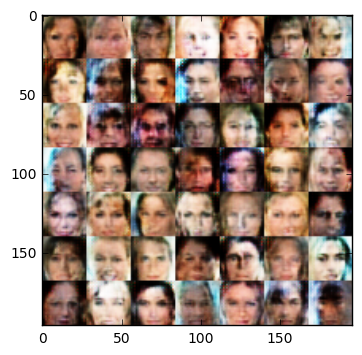

Epoch 1/1... Generator Loss: 2.2282 Discriminator Loss: 0.4501...
Epoch 1/1... Generator Loss: 3.1643 Discriminator Loss: 0.1813...
Epoch 1/1... Generator Loss: 2.3836 Discriminator Loss: 0.2448...
Epoch 1/1... Generator Loss: 2.6965 Discriminator Loss: 0.1141...
Epoch 1/1... Generator Loss: 3.0797 Discriminator Loss: 0.2395...


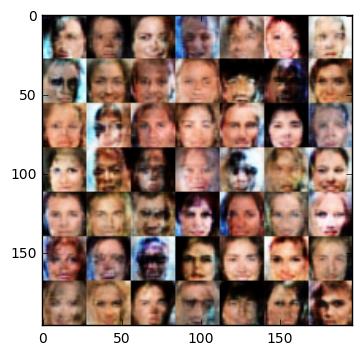

Epoch 1/1... Generator Loss: 3.1555 Discriminator Loss: 0.0943...
Epoch 1/1... Generator Loss: 4.1426 Discriminator Loss: 0.0983...
Epoch 1/1... Generator Loss: 4.6969 Discriminator Loss: 3.0088...
Epoch 1/1... Generator Loss: 0.8653 Discriminator Loss: 0.8424...
Epoch 1/1... Generator Loss: 2.8335 Discriminator Loss: 0.6626...


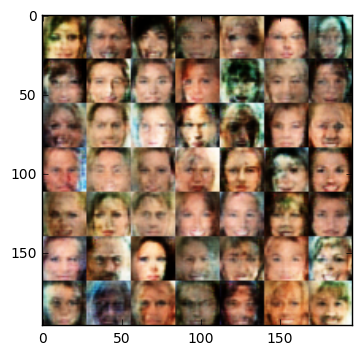

Epoch 1/1... Generator Loss: 1.7452 Discriminator Loss: 0.5141...
Epoch 1/1... Generator Loss: 1.1567 Discriminator Loss: 0.6959...
Epoch 1/1... Generator Loss: 3.7483 Discriminator Loss: 0.0905...
Epoch 1/1... Generator Loss: 1.9345 Discriminator Loss: 0.5020...
Epoch 1/1... Generator Loss: 2.2716 Discriminator Loss: 0.2260...


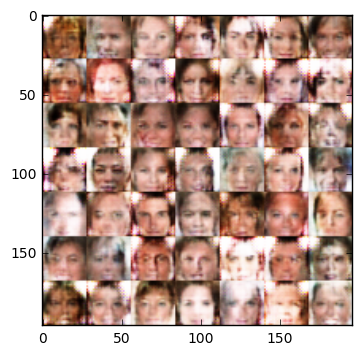

Epoch 1/1... Generator Loss: 5.7565 Discriminator Loss: 0.0786...
Epoch 1/1... Generator Loss: 8.0135 Discriminator Loss: 0.0432...
Epoch 1/1... Generator Loss: 3.4776 Discriminator Loss: 0.0799...
Epoch 1/1... Generator Loss: 5.2317 Discriminator Loss: 0.0352...
Epoch 1/1... Generator Loss: 6.9675 Discriminator Loss: 2.3578...


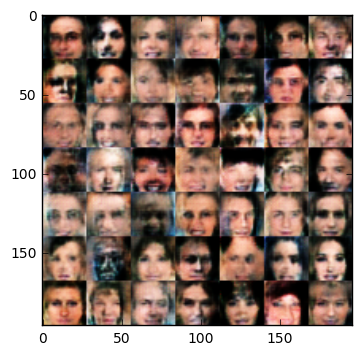

Epoch 1/1... Generator Loss: 2.2831 Discriminator Loss: 0.5289...
Epoch 1/1... Generator Loss: 1.3474 Discriminator Loss: 0.6011...
Epoch 1/1... Generator Loss: 1.7811 Discriminator Loss: 0.3076...
Epoch 1/1... Generator Loss: 0.6268 Discriminator Loss: 1.2014...
Epoch 1/1... Generator Loss: 4.0730 Discriminator Loss: 1.5323...


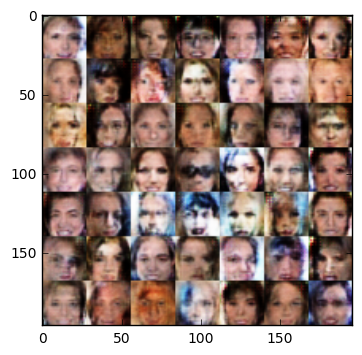

Epoch 1/1... Generator Loss: 1.6655 Discriminator Loss: 0.4210...
Epoch 1/1... Generator Loss: 0.6877 Discriminator Loss: 1.0731...
Epoch 1/1... Generator Loss: 3.0025 Discriminator Loss: 0.1376...
Epoch 1/1... Generator Loss: 3.6687 Discriminator Loss: 0.1114...
Epoch 1/1... Generator Loss: 2.3161 Discriminator Loss: 0.1748...


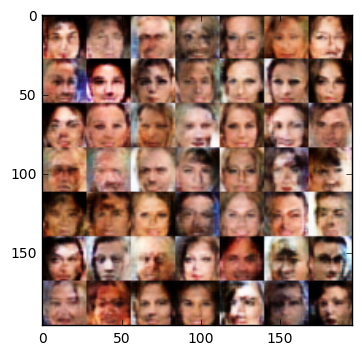

Epoch 1/1... Generator Loss: 2.4049 Discriminator Loss: 0.2061...
Epoch 1/1... Generator Loss: 1.4165 Discriminator Loss: 0.3777...
Epoch 1/1... Generator Loss: 0.9164 Discriminator Loss: 0.6379...
Epoch 1/1... Generator Loss: 0.7950 Discriminator Loss: 0.9220...
Epoch 1/1... Generator Loss: 1.4032 Discriminator Loss: 0.4842...


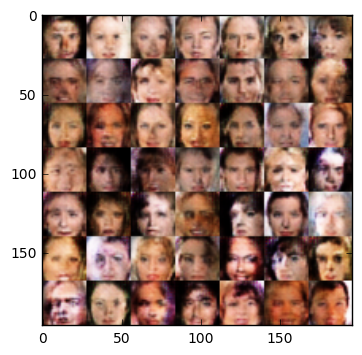

Epoch 1/1... Generator Loss: 2.7214 Discriminator Loss: 0.1530...
Epoch 1/1... Generator Loss: 2.5874 Discriminator Loss: 0.4570...
Epoch 1/1... Generator Loss: 1.4401 Discriminator Loss: 0.4743...
Epoch 1/1... Generator Loss: 3.5959 Discriminator Loss: 0.1392...
Epoch 1/1... Generator Loss: 0.4055 Discriminator Loss: 1.5423...


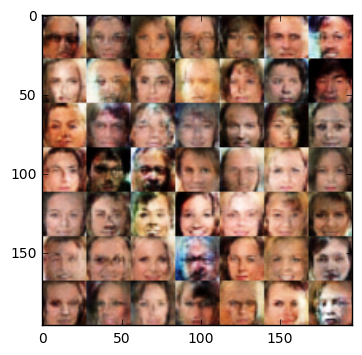

Epoch 1/1... Generator Loss: 1.7001 Discriminator Loss: 0.5636...
Epoch 1/1... Generator Loss: 1.9641 Discriminator Loss: 0.5508...
Epoch 1/1... Generator Loss: 0.9194 Discriminator Loss: 1.0344...
Epoch 1/1... Generator Loss: 2.0534 Discriminator Loss: 0.5896...
Epoch 1/1... Generator Loss: 2.1167 Discriminator Loss: 0.2560...


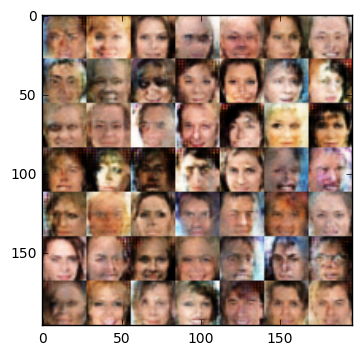

Epoch 1/1... Generator Loss: 1.5240 Discriminator Loss: 0.3794...
Epoch 1/1... Generator Loss: 0.5567 Discriminator Loss: 1.2854...
Epoch 1/1... Generator Loss: 0.9785 Discriminator Loss: 0.7302...
Epoch 1/1... Generator Loss: 1.8595 Discriminator Loss: 0.3872...
Epoch 1/1... Generator Loss: 1.3193 Discriminator Loss: 0.7864...


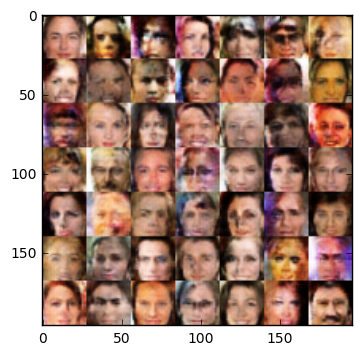

Epoch 1/1... Generator Loss: 2.0435 Discriminator Loss: 0.3478...
Epoch 1/1... Generator Loss: 2.4838 Discriminator Loss: 0.2714...
Epoch 1/1... Generator Loss: 4.1517 Discriminator Loss: 1.4284...
Epoch 1/1... Generator Loss: 0.3690 Discriminator Loss: 1.4852...
Epoch 1/1... Generator Loss: 1.7369 Discriminator Loss: 0.3115...


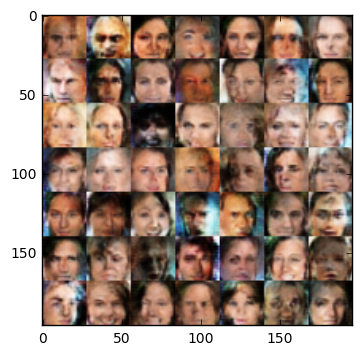

Epoch 1/1... Generator Loss: 0.3004 Discriminator Loss: 1.7265...
Epoch 1/1... Generator Loss: 2.3357 Discriminator Loss: 0.2369...
Epoch 1/1... Generator Loss: 1.7918 Discriminator Loss: 0.2954...
Epoch 1/1... Generator Loss: 1.7007 Discriminator Loss: 0.4958...
Epoch 1/1... Generator Loss: 0.8835 Discriminator Loss: 0.8344...


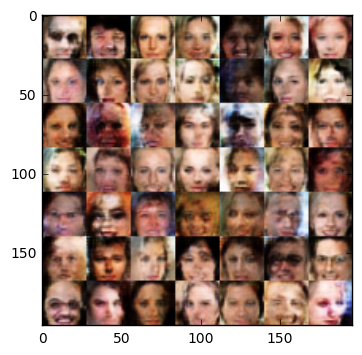

Epoch 1/1... Generator Loss: 2.1367 Discriminator Loss: 0.2922...
Epoch 1/1... Generator Loss: 0.7583 Discriminator Loss: 0.9574...
Epoch 1/1... Generator Loss: 3.0094 Discriminator Loss: 0.1975...
Epoch 1/1... Generator Loss: 2.9524 Discriminator Loss: 0.2379...
Epoch 1/1... Generator Loss: 3.3728 Discriminator Loss: 0.0966...


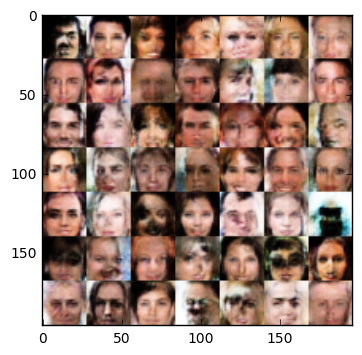

Epoch 1/1... Generator Loss: 3.0626 Discriminator Loss: 0.1208...
Epoch 1/1... Generator Loss: 1.9130 Discriminator Loss: 0.2677...
Epoch 1/1... Generator Loss: 5.1416 Discriminator Loss: 1.4560...
Epoch 1/1... Generator Loss: 1.1911 Discriminator Loss: 0.5805...
Epoch 1/1... Generator Loss: 1.6606 Discriminator Loss: 0.3971...


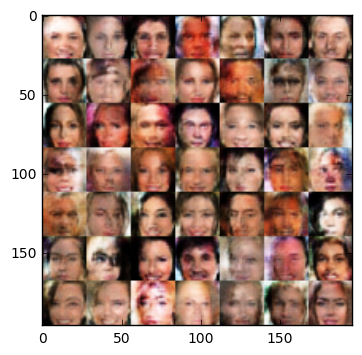

Epoch 1/1... Generator Loss: 3.6813 Discriminator Loss: 0.1492...
Epoch 1/1... Generator Loss: 3.0199 Discriminator Loss: 0.1201...
Epoch 1/1... Generator Loss: 3.7835 Discriminator Loss: 0.1677...


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.